# Energy Production Data - Exploratory Data Analysis (EDA)

**Objective**: Use wind and hydroelectric power production to predict the sum of other energy production

This notebook contains a complete exploratory data analysis workflow, including:
1. Data loading and preprocessing
2. Manual EDA with custom analysis and visualizations
3. Automated EDA using specialized packages
4. Deseasonalization analysis
5. Statistical tests and hypothesis validation
6. Feature engineering (manual and automated)
7. Data quality assessment
8. AutoML modeling with AutoGluon
9. Summary and conclusions


In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import warnings
import os
from scipy import stats
from statsmodels.tsa.stattools import acf
from mpl_toolkits.mplot3d import Axes3D

warnings.filterwarnings('ignore')

# Set plotting style
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (15, 10)

print("Libraries imported successfully!")


Libraries imported successfully!


# 1. Data Loading & Preprocessing

**Purpose**: Load and prepare the raw data for analysis. This step ensures data quality and creates the foundation for all subsequent analyses.

## 1.1 Load Data


In [2]:
# Load data
df = pd.read_csv('electricityConsumptionAndProductioction.csv')

# Convert DateTime column to datetime type
df['DateTime'] = pd.to_datetime(df['DateTime'])

# Sort by time
df = df.sort_values('DateTime').reset_index(drop=True)

print(f"Data shape: {df.shape}")
print(f"Time range: {df['DateTime'].min()} to {df['DateTime'].max()}")
print(f"Total records: {len(df)}")


Data shape: (54170, 10)
Time range: 2019-01-01 00:00:00 to 2025-03-19 23:00:00
Total records: 54170


## 1.2 Basic Information

**Purpose**: Understand the structure, data types, and basic statistics of the dataset. This helps identify data quality issues and guides subsequent analysis decisions.


In [3]:
# Display first few rows
df.head()


,DateTime,Consumption,Production,Nuclear,Wind,Hydroelectric,Oil and Gas,Coal,Solar,Biomass
0,2019-01-01 00:00:00,6352,6527,1395,79,1383,1896,1744,0,30
1,2019-01-01 01:00:00,6116,5701,1393,96,1112,1429,1641,0,30
2,2019-01-01 02:00:00,5873,5676,1393,142,1030,1465,1616,0,30
3,2019-01-01 03:00:00,5682,5603,1397,191,972,1455,1558,0,30
4,2019-01-01 04:00:00,5557,5454,1393,159,960,1454,1458,0,30


In [4]:
# Data information
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54170 entries, 0 to 54169
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   DateTime       54170 non-null  datetime64[ns]
 1   Consumption    54170 non-null  int64         
 2   Production     54170 non-null  int64         
 3   Nuclear        54170 non-null  int64         
 4   Wind           54170 non-null  int64         
 5   Hydroelectric  54170 non-null  int64         
 6   Oil and Gas    54170 non-null  int64         
 7   Coal           54170 non-null  int64         
 8   Solar          54170 non-null  int64         
 9   Biomass        54170 non-null  int64         
dtypes: datetime64[ns](1), int64(9)
memory usage: 4.1 MB


In [5]:
# Basic statistical summary
df.describe()


,DateTime,Consumption,Production,Nuclear,Wind,Hydroelectric,Oil and Gas,Coal,Solar,Biomass
count,54170,54170.000000,54170.000000,54170.000000,54170.000000,54170.000000,54170.000000,54170.000000,54170.000000,54170.000000
mean,2022-02-03 00:21:43.097655552,6526.463688,6380.179989,1282.480377,771.727691,1792.639616,1166.843696,1138.501052,171.808381,54.938859
min,2019-01-01 00:00:00,2922.000000,3119.000000,562.000000,-26.000000,175.000000,195.000000,279.000000,0.000000,17.000000
25%,2020-07-18 06:15:00,5710.000000,5639.000000,1341.000000,228.000000,1281.000000,860.000000,890.000000,0.000000,45.000000
50%,2022-02-02 09:30:00,6474.000000,6322.000000,1378.000000,571.000000,1679.000000,1208.000000,1113.000000,3.000000,55.000000
75%,2023-08-20 15:45:00,7268.000000,7057.750000,1400.000000,1167.000000,2191.000000,1510.000000,1358.000000,302.000000,65.000000
max,2025-03-19 23:00:00,9615.000000,9886.000000,1457.000000,2811.000000,4434.000000,2141.000000,2537.000000,1552.000000,89.000000
std,NaN,1048.248455,1015.393399,241.188791,666.534396,679.983743,433.926493,329.928643,257.257698,13.761794


In [6]:
# Missing values statistics
missing = df.isnull().sum()
print("Missing values:")
print(missing[missing > 0] if missing.sum() > 0 else "No missing values")


Missing values:
No missing values


## 1.3 Create Target Variable

**Purpose**: Define the target variable (Other_Production) that we want to predict. This is the sum of all energy sources except Wind and Hydroelectric.

Target variable = Nuclear + Oil and Gas + Coal + Solar + Biomass


In [7]:
# Create target variable: sum of other energy production
df['Other_Production'] = (df['Nuclear'] + df['Oil and Gas'] + 
                          df['Coal'] + df['Solar'] + df['Biomass'])

# Validation: total production should equal sum of all energy sources
df['Production_Check'] = (df['Wind'] + df['Hydroelectric'] + 
                          df['Other_Production'])
df['Production_Diff'] = abs(df['Production'] - df['Production_Check'])

print(f"Production validation:")
print(f"Maximum difference: {df['Production_Diff'].max()}")
print(f"Average difference: {df['Production_Diff'].mean()}")
print(f"Records with difference > 1: {(df['Production_Diff'] > 1).sum()}")


Production validation:
Maximum difference: 821
Average difference: 3.6448587779213586
Records with difference > 1: 23765


# 2. Manual EDA

**Purpose**: Perform custom exploratory data analysis to understand data distributions, relationships, and patterns. EDA helps identify important features, detect anomalies, and guide feature engineering decisions. The insights from EDA inform model selection and preprocessing strategies.

## 2.1 Descriptive Statistics

**Purpose**: Understand the central tendencies, variability, and distributions of key variables. This helps identify outliers, understand data scales, and determine appropriate preprocessing steps.


In [8]:
# Key variables statistics
features = ['Wind', 'Hydroelectric', 'Other_Production']
df[features].describe()


,Wind,Hydroelectric,Other_Production
count,54170.000000,54170.000000,54170.000000
mean,771.727691,1792.639616,3814.572365
std,666.534396,679.983743,685.779885
min,-26.000000,175.000000,1483.000000
25%,228.000000,1281.000000,3393.000000
50%,571.000000,1679.000000,3860.000000
75%,1167.000000,2191.000000,4283.000000
max,2811.000000,4434.000000,6221.000000


In [9]:
# Check for negative values (may indicate data quality issues)
print("Negative values check:")
for col in ['Wind', 'Hydroelectric', 'Other_Production', 'Production']:
    neg_count = (df[col] < 0).sum()
    if neg_count > 0:
        print(f"{col}: {neg_count} negative values")
        print(f"  Minimum: {df[col].min()}")
        print(f"  Negative percentage: {neg_count/len(df)*100:.2f}%")


Negative values check:
Wind: 592 negative values
  Minimum: -26
  Negative percentage: 1.09%


## 2.2 Temporal Feature Analysis

**Purpose**: Extract time-based features (hour, day, month, etc.) that capture seasonal patterns and temporal dependencies. These features are crucial for time series prediction as they help the model understand cyclical patterns.


In [10]:
# Extract temporal features
df['Year'] = df['DateTime'].dt.year
df['Month'] = df['DateTime'].dt.month
df['Day'] = df['DateTime'].dt.day
df['Hour'] = df['DateTime'].dt.hour
df['DayOfWeek'] = df['DateTime'].dt.dayofweek
df['DayOfYear'] = df['DateTime'].dt.dayofyear

print("Temporal range statistics:")
print(f"Years: {df['Year'].unique()}")
print(f"Months: {sorted(df['Month'].unique())}")
print(f"Hours: {sorted(df['Hour'].unique())}")


Temporal range statistics:
Years: [2019 2020 2021 2022 2023 2024 2025]
Months: [np.int32(1), np.int32(2), np.int32(3), np.int32(4), np.int32(5), np.int32(6), np.int32(7), np.int32(8), np.int32(9), np.int32(10), np.int32(11), np.int32(12)]
Hours: [np.int32(0), np.int32(1), np.int32(2), np.int32(3), np.int32(4), np.int32(5), np.int32(6), np.int32(7), np.int32(8), np.int32(9), np.int32(10), np.int32(11), np.int32(12), np.int32(13), np.int32(14), np.int32(15), np.int32(16), np.int32(17), np.int32(18), np.int32(19), np.int32(20), np.int32(21), np.int32(22), np.int32(23)]


## 2.3 Correlation Analysis

**Purpose**: Identify relationships between features and the target variable. Strong correlations indicate predictive features, while multicollinearity between features can guide feature selection. This analysis helps prioritize which features to use in modeling.


In [11]:
# Calculate correlation matrix
corr_cols = ['Wind', 'Hydroelectric', 'Other_Production', 'Production', 
             'Consumption', 'Nuclear', 'Oil and Gas', 'Coal', 'Solar', 'Biomass']
corr_matrix = df[corr_cols].corr()

# Key variables correlation
print("Key variables correlation matrix:")
print(corr_matrix[['Wind', 'Hydroelectric']].loc[['Other_Production', 'Production']])


Key variables correlation matrix:
                      Wind  Hydroelectric
Other_Production -0.012846      -0.211050
Production        0.547370       0.426415


In [12]:
# Display full correlation matrix
corr_matrix


,Wind,Hydroelectric,Other_Production,Production,Consumption,Nuclear,Oil and Gas,Coal,Solar,Biomass
Wind,1.000000,-0.150315,-0.012846,0.547370,0.088225,0.121337,0.061389,-0.098233,-0.131456,0.110086
Hydroelectric,-0.150315,1.000000,-0.211050,0.426415,0.307053,-0.356007,-0.211116,0.076164,0.033727,-0.077416
Other_Production,-0.012846,-0.211050,1.000000,0.526159,0.617960,0.493288,0.766579,0.583660,0.139491,0.415224
Production,0.547370,0.426415,0.526159,1.000000,0.681003,0.173896,0.418187,0.380018,0.030743,0.300670
Consumption,0.088225,0.307053,0.617960,0.681003,1.000000,0.147747,0.494118,0.475399,0.045189,0.382624
Nuclear,0.121337,-0.356007,0.493288,0.173896,0.147747,1.000000,0.280926,0.021643,-0.137071,0.241170
Oil and Gas,0.061389,-0.211116,0.766579,0.418187,0.494118,0.280926,1.000000,0.213912,-0.201225,0.378793
Coal,-0.098233,0.076164,0.583660,0.380018,0.475399,0.021643,0.213912,1.000000,-0.120251,0.234490
Solar,-0.131456,0.033727,0.139491,0.030743,0.045189,-0.137071,-0.201225,-0.120251,1.000000,-0.112378
Biomass,0.110086,-0.077416,0.415224,0.300670,0.382624,0.241170,0.378793,0.234490,-0.112378,1.000000


## 2.4 Visualization

**Purpose**: Visual representations help identify patterns, trends, and anomalies that may not be apparent in numerical statistics. Visualizations are essential for communicating findings and validating assumptions.

### 2.4.1 Time Series Plots


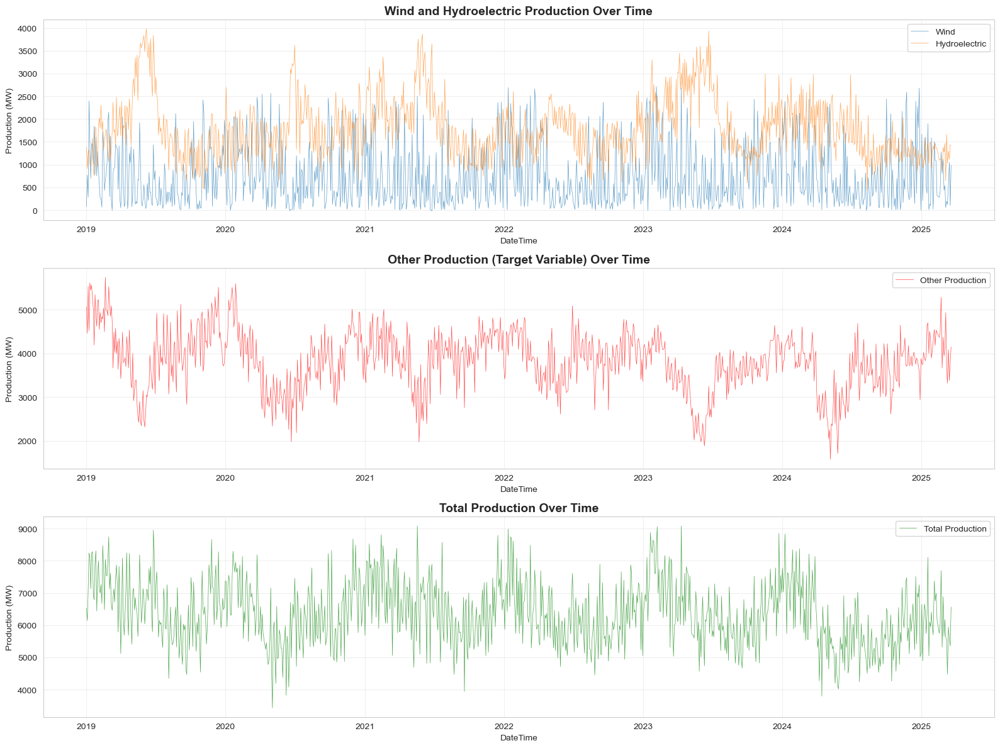

In [13]:
# Create directory for saving plots
os.makedirs('eda_plots', exist_ok=True)

# Sample data for visualization (if dataset is too large)
sample_size = min(1000, len(df))
df_sample = df.iloc[::max(1, len(df)//sample_size)]

fig, axes = plt.subplots(3, 1, figsize=(16, 12))

axes[0].plot(df_sample['DateTime'], df_sample['Wind'], label='Wind', alpha=0.7, linewidth=0.5)
axes[0].plot(df_sample['DateTime'], df_sample['Hydroelectric'], label='Hydroelectric', alpha=0.7, linewidth=0.5)
axes[0].set_title('Wind and Hydroelectric Production Over Time', fontsize=14, fontweight='bold')
axes[0].set_xlabel('DateTime')
axes[0].set_ylabel('Production (MW)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].plot(df_sample['DateTime'], df_sample['Other_Production'], label='Other Production', 
             color='red', alpha=0.7, linewidth=0.5)
axes[1].set_title('Other Production (Target Variable) Over Time', fontsize=14, fontweight='bold')
axes[1].set_xlabel('DateTime')
axes[1].set_ylabel('Production (MW)')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

axes[2].plot(df_sample['DateTime'], df_sample['Production'], label='Total Production', 
             color='green', alpha=0.7, linewidth=0.5)
axes[2].set_title('Total Production Over Time', fontsize=14, fontweight='bold')
axes[2].set_xlabel('DateTime')
axes[2].set_ylabel('Production (MW)')
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('eda_plots/01_time_series.png', dpi=300, bbox_inches='tight')
plt.show()


### 2.4.2 Distribution Plots

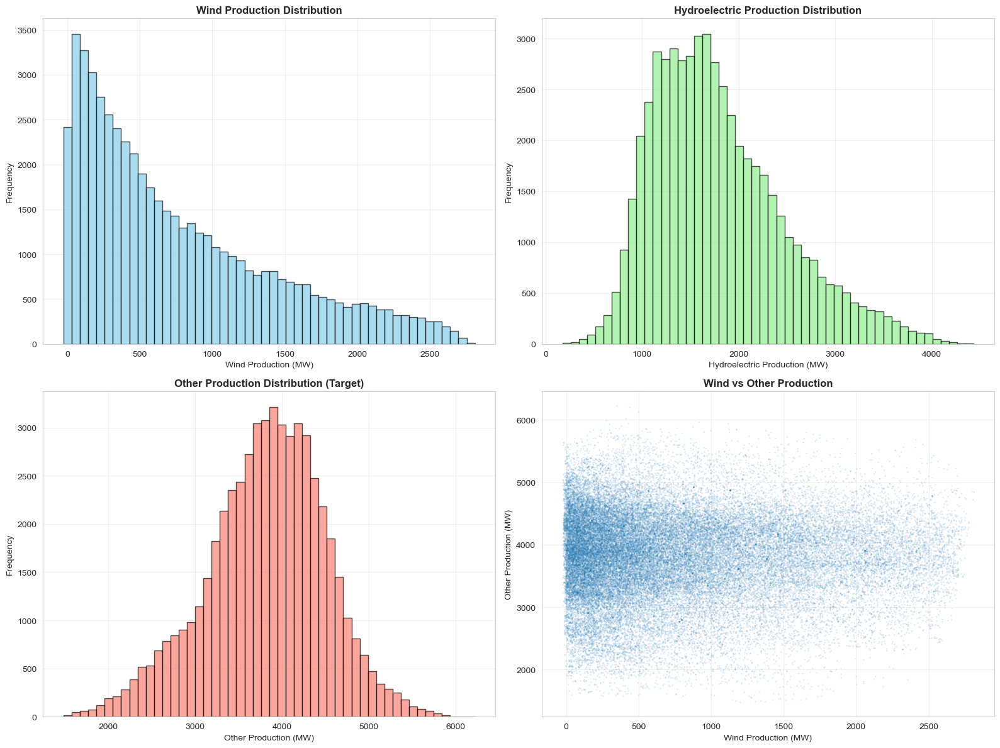

In [14]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

axes[0, 0].hist(df['Wind'], bins=50, alpha=0.7, color='skyblue', edgecolor='black')
axes[0, 0].set_title('Wind Production Distribution', fontsize=12, fontweight='bold')
axes[0, 0].set_xlabel('Wind Production (MW)')
axes[0, 0].set_ylabel('Frequency')
axes[0, 0].grid(True, alpha=0.3)

axes[0, 1].hist(df['Hydroelectric'], bins=50, alpha=0.7, color='lightgreen', edgecolor='black')
axes[0, 1].set_title('Hydroelectric Production Distribution', fontsize=12, fontweight='bold')
axes[0, 1].set_xlabel('Hydroelectric Production (MW)')
axes[0, 1].set_ylabel('Frequency')
axes[0, 1].grid(True, alpha=0.3)

axes[1, 0].hist(df['Other_Production'], bins=50, alpha=0.7, color='salmon', edgecolor='black')
axes[1, 0].set_title('Other Production Distribution (Target)', fontsize=12, fontweight='bold')
axes[1, 0].set_xlabel('Other Production (MW)')
axes[1, 0].set_ylabel('Frequency')
axes[1, 0].grid(True, alpha=0.3)

axes[1, 1].scatter(df['Wind'], df['Other_Production'], alpha=0.1, s=1)
axes[1, 1].set_title('Wind vs Other Production', fontsize=12, fontweight='bold')
axes[1, 1].set_xlabel('Wind Production (MW)')
axes[1, 1].set_ylabel('Other Production (MW)')
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('eda_plots/02_distributions.png', dpi=300, bbox_inches='tight')
plt.show()


### 2.4.3 Correlation Heatmap


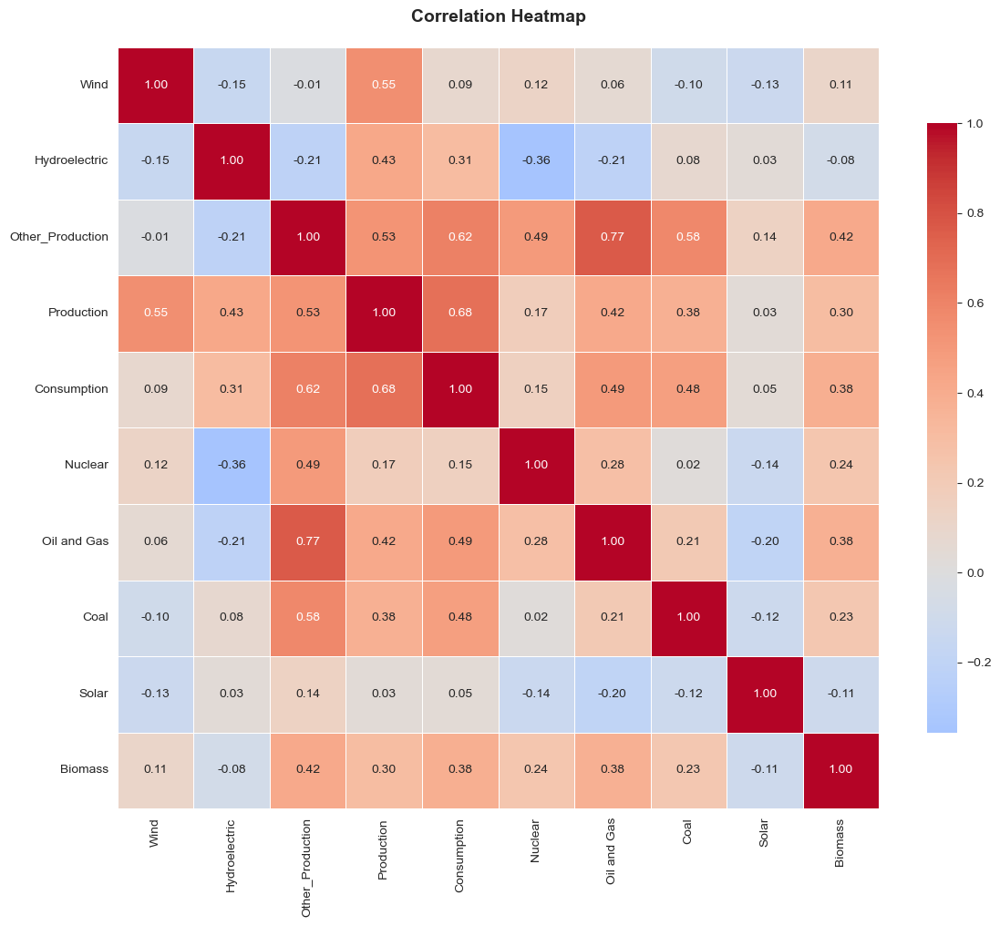

In [15]:
fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', center=0,
            square=True, linewidths=0.5, cbar_kws={"shrink": 0.8}, ax=ax)
ax.set_title('Correlation Heatmap', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.savefig('eda_plots/03_correlation_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()


### 2.4.4 Scatter Plot Matrix


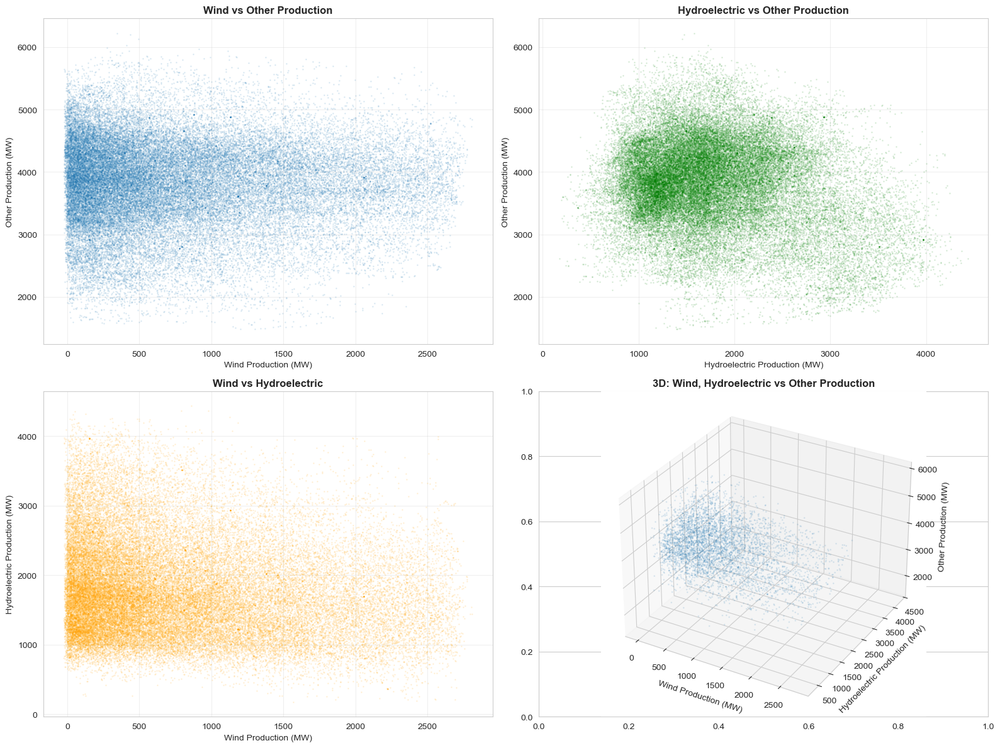

In [16]:
fig = plt.figure(figsize=(16, 12))
axes = fig.subplots(2, 2)

axes[0, 0].scatter(df['Wind'], df['Other_Production'], alpha=0.1, s=1)
axes[0, 0].set_xlabel('Wind Production (MW)')
axes[0, 0].set_ylabel('Other Production (MW)')
axes[0, 0].set_title('Wind vs Other Production', fontweight='bold')
axes[0, 0].grid(True, alpha=0.3)

axes[0, 1].scatter(df['Hydroelectric'], df['Other_Production'], alpha=0.1, s=1, color='green')
axes[0, 1].set_xlabel('Hydroelectric Production (MW)')
axes[0, 1].set_ylabel('Other Production (MW)')
axes[0, 1].set_title('Hydroelectric vs Other Production', fontweight='bold')
axes[0, 1].grid(True, alpha=0.3)

axes[1, 0].scatter(df['Wind'], df['Hydroelectric'], alpha=0.1, s=1, color='orange')
axes[1, 0].set_xlabel('Wind Production (MW)')
axes[1, 0].set_ylabel('Hydroelectric Production (MW)')
axes[1, 0].set_title('Wind vs Hydroelectric', fontweight='bold')
axes[1, 0].grid(True, alpha=0.3)

# 3D散点图
ax_3d = fig.add_subplot(2, 2, 4, projection='3d')
sample_3d = df.sample(min(5000, len(df)))
ax_3d.scatter(sample_3d['Wind'], sample_3d['Hydroelectric'], 
              sample_3d['Other_Production'], alpha=0.1, s=1)
ax_3d.set_xlabel('Wind Production (MW)')
ax_3d.set_ylabel('Hydroelectric Production (MW)')
ax_3d.set_zlabel('Other Production (MW)')
ax_3d.set_title('3D: Wind, Hydroelectric vs Other Production', fontweight='bold')

plt.tight_layout()
plt.savefig('eda_plots/04_scatter_matrix.png', dpi=300, bbox_inches='tight')
plt.show()


### 2.4.5 Temporal Patterns Analysis


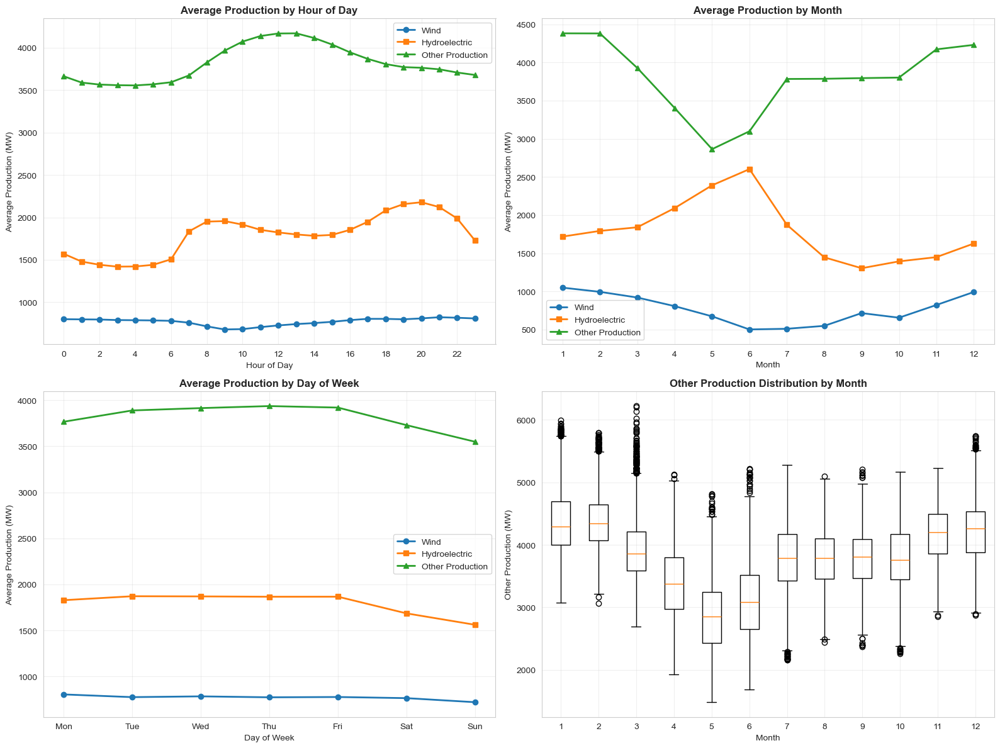

In [17]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 按小时的平均值
hourly_avg = df.groupby('Hour')[['Wind', 'Hydroelectric', 'Other_Production']].mean()
axes[0, 0].plot(hourly_avg.index, hourly_avg['Wind'], marker='o', label='Wind', linewidth=2)
axes[0, 0].plot(hourly_avg.index, hourly_avg['Hydroelectric'], marker='s', label='Hydroelectric', linewidth=2)
axes[0, 0].plot(hourly_avg.index, hourly_avg['Other_Production'], marker='^', label='Other Production', linewidth=2)
axes[0, 0].set_xlabel('Hour of Day')
axes[0, 0].set_ylabel('Average Production (MW)')
axes[0, 0].set_title('Average Production by Hour of Day', fontweight='bold')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)
axes[0, 0].set_xticks(range(0, 24, 2))

# 按月份的平均值
monthly_avg = df.groupby('Month')[['Wind', 'Hydroelectric', 'Other_Production']].mean()
axes[0, 1].plot(monthly_avg.index, monthly_avg['Wind'], marker='o', label='Wind', linewidth=2)
axes[0, 1].plot(monthly_avg.index, monthly_avg['Hydroelectric'], marker='s', label='Hydroelectric', linewidth=2)
axes[0, 1].plot(monthly_avg.index, monthly_avg['Other_Production'], marker='^', label='Other Production', linewidth=2)
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('Average Production (MW)')
axes[0, 1].set_title('Average Production by Month', fontweight='bold')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)
axes[0, 1].set_xticks(range(1, 13))

# 按星期几的平均值
dow_avg = df.groupby('DayOfWeek')[['Wind', 'Hydroelectric', 'Other_Production']].mean()
dow_labels = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
axes[1, 0].plot(dow_avg.index, dow_avg['Wind'], marker='o', label='Wind', linewidth=2)
axes[1, 0].plot(dow_avg.index, dow_avg['Hydroelectric'], marker='s', label='Hydroelectric', linewidth=2)
axes[1, 0].plot(dow_avg.index, dow_avg['Other_Production'], marker='^', label='Other Production', linewidth=2)
axes[1, 0].set_xlabel('Day of Week')
axes[1, 0].set_ylabel('Average Production (MW)')
axes[1, 0].set_title('Average Production by Day of Week', fontweight='bold')
axes[1, 0].set_xticks(range(7))
axes[1, 0].set_xticklabels(dow_labels)
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

# 箱线图：按月份的其他生产量
monthly_data = [df[df['Month'] == month]['Other_Production'].values for month in range(1, 13)]
axes[1, 1].boxplot(monthly_data, labels=range(1, 13))
axes[1, 1].set_xlabel('Month')
axes[1, 1].set_ylabel('Other Production (MW)')
axes[1, 1].set_title('Other Production Distribution by Month', fontweight='bold')
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('eda_plots/05_temporal_patterns.png', dpi=300, bbox_inches='tight')
plt.show()


### 2.4.6 Energy Composition Analysis


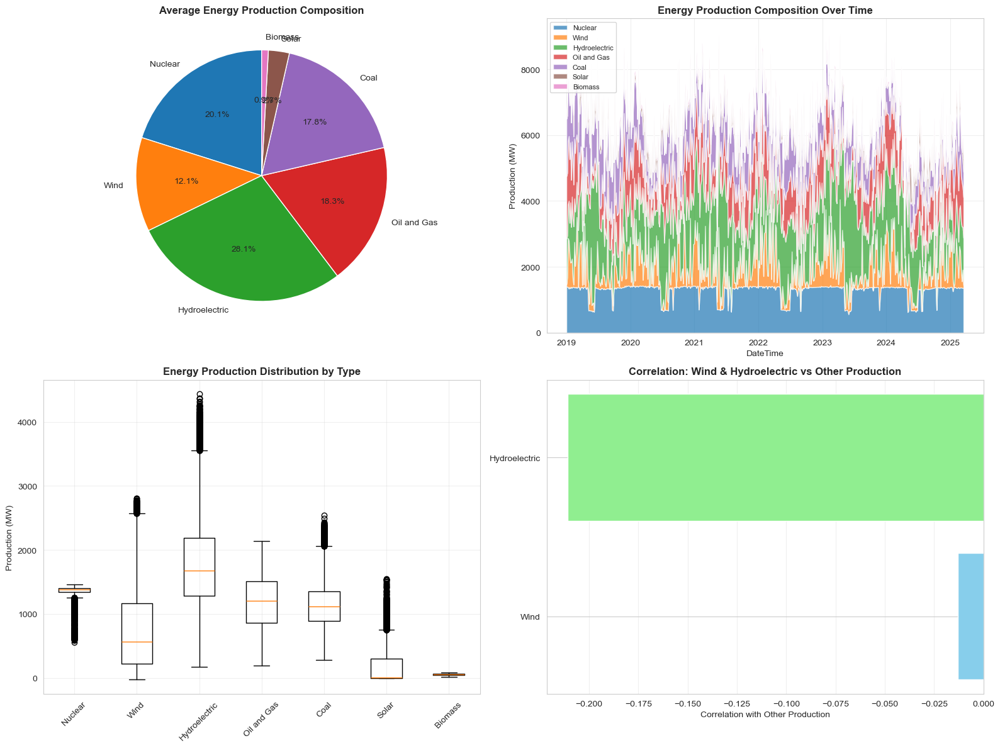

In [18]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 平均能源组成（饼图）
energy_cols = ['Nuclear', 'Wind', 'Hydroelectric', 'Oil and Gas', 'Coal', 'Solar', 'Biomass']
energy_avg = df[energy_cols].mean()
axes[0, 0].pie(energy_avg.values, labels=energy_avg.index, autopct='%1.1f%%', startangle=90)
axes[0, 0].set_title('Average Energy Production Composition', fontweight='bold', fontsize=12)

# 能源组成的时间序列（堆叠面积图）
sample_size = min(500, len(df))
df_sample2 = df.iloc[::max(1, len(df)//sample_size)].copy()
axes[0, 1].stackplot(df_sample2['DateTime'], 
                     df_sample2['Nuclear'],
                     df_sample2['Wind'],
                     df_sample2['Hydroelectric'],
                     df_sample2['Oil and Gas'],
                     df_sample2['Coal'],
                     df_sample2['Solar'],
                     df_sample2['Biomass'],
                     labels=energy_cols, alpha=0.7)
axes[0, 1].set_title('Energy Production Composition Over Time', fontweight='bold')
axes[0, 1].set_xlabel('DateTime')
axes[0, 1].set_ylabel('Production (MW)')
axes[0, 1].legend(loc='upper left', fontsize=8)
axes[0, 1].grid(True, alpha=0.3)

# 各能源的箱线图
energy_data = [df[col].values for col in energy_cols]
axes[1, 0].boxplot(energy_data, labels=energy_cols)
axes[1, 0].set_title('Energy Production Distribution by Type', fontweight='bold')
axes[1, 0].set_ylabel('Production (MW)')
axes[1, 0].tick_params(axis='x', rotation=45)
axes[1, 0].grid(True, alpha=0.3)

# 相关性条形图（Wind和Hydroelectric与其他变量的相关性）
corr_with_target = corr_matrix[['Wind', 'Hydroelectric']].loc[['Other_Production']].T
axes[1, 1].barh(corr_with_target.index, corr_with_target['Other_Production'], color=['skyblue', 'lightgreen'])
axes[1, 1].set_xlabel('Correlation with Other Production')
axes[1, 1].set_title('Correlation: Wind & Hydroelectric vs Other Production', fontweight='bold')
axes[1, 1].grid(True, alpha=0.3, axis='x')
axes[1, 1].axvline(x=0, color='black', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.savefig('eda_plots/06_energy_composition.png', dpi=300, bbox_inches='tight')
plt.show()


# 3. Automated EDA

**Purpose**: Use specialized automated EDA tools to generate comprehensive reports quickly. These tools can identify patterns, correlations, and data quality issues that might be missed in manual analysis. The automated reports provide a standardized view of the data.

## 3.1 Using ydata-profiling (formerly pandas-profiling)

**Purpose**: Generate a comprehensive automated EDA report with statistics, correlations, missing value patterns, and interactive visualizations. This provides a quick overview of the entire dataset.


In [19]:

#Prepare data for automated EDA
# Select key columns for automated analysis
key_cols = ['DateTime', 'Wind', 'Hydroelectric', 'Other_Production', 
            'Production', 'Consumption', 'Year', 'Month', 'Hour', 'DayOfWeek']
df_eda = df[key_cols].copy()

# Method 1: Using ydata-profiling
try:
    from ydata_profiling import ProfileReport
    
    print("Generating ydata-profiling report... (This may take a few minutes)")
    profile = ProfileReport(
        df_eda,
        title="Energy Production Data EDA Report",
        explorative=True,
        minimal=False,
        correlations={
            "pearson": {"calculate": True},
            "spearman": {"calculate": True},
            "kendall": {"calculate": True},
        },
        interactions={"continuous": True},
        missing_diagrams={"bar": True, "matrix": True, "heatmap": True},
        duplicates={"head": 10},
    )
    
    profile.to_file("eda_plots/automated_report_ydata_profiling.html")
    print("✓ Report saved to: eda_plots/automated_report_ydata_profiling.html")
    display(profile)
except ImportError:
    print("✗ ydata-profiling not installed. Install with: pip install ydata-profiling")
except Exception as e:
    print(f"✗ Error generating report: {e}")


Generating ydata-profiling report... (This may take a few minutes)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|███████████████████████████████████| 10/10 [00:00<00:00, 253.17it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

✓ Report saved to: eda_plots/automated_report_ydata_profiling.html


# 4. Deseasonalization

**Purpose**: Remove seasonal patterns from time series data to reveal underlying trends and relationships. Deseasonalization can improve model performance by removing predictable cyclical patterns, allowing the model to focus on the relationships between variables rather than seasonal effects.

## 4.1 Seasonal Decomposition

**Purpose**: Decompose time series into trend, seasonal, and residual components. This helps understand the nature of seasonality and enables creation of deseasonalized variables for modeling.


In [31]:
# Seasonal decomposition using statsmodels
from statsmodels.tsa.seasonal import seasonal_decompose

print("Performing seasonal decomposition...")
print("=" * 60)

# Variables to decompose
variables = ['Wind', 'Hydroelectric', 'Other_Production']
decompositions = {}

# Perform decomposition for each variable
# For hourly data: period=24 (daily), period=168 (weekly)
for var in variables:
    print(f"\nDecomposing {var}...")
    
    # Daily seasonality (24 hours)
    try:
        decomp_daily = seasonal_decompose(
            df[var].dropna(), 
            model='additive', 
            period=24,  # 24 hours = 1 day
            extrapolate_trend='freq'
        )
        decompositions[f'{var}_daily'] = decomp_daily
        print(f"  Daily decomposition completed (period=24)")
    except Exception as e:
        print(f"  Daily decomposition failed: {e}")
        decompositions[f'{var}_daily'] = None
    
    # Weekly seasonality (168 hours = 7 days * 24 hours)
    try:
        decomp_weekly = seasonal_decompose(
            df[var].dropna(), 
            model='additive', 
            period=168,  # 168 hours = 1 week
            extrapolate_trend='freq'
        )
        decompositions[f'{var}_weekly'] = decomp_weekly
        print(f"  Weekly decomposition completed (period=168)")
    except Exception as e:
        print(f"  Weekly decomposition failed: {e}")
        decompositions[f'{var}_weekly'] = None

print("\n✓ Seasonal decomposition completed!")


Performing seasonal decomposition...

Decomposing Wind...
  Daily decomposition completed (period=24)
  Weekly decomposition completed (period=168)

Decomposing Hydroelectric...
  Daily decomposition completed (period=24)
  Weekly decomposition completed (period=168)

Decomposing Other_Production...
  Daily decomposition completed (period=24)
  Weekly decomposition completed (period=168)

✓ Seasonal decomposition completed!


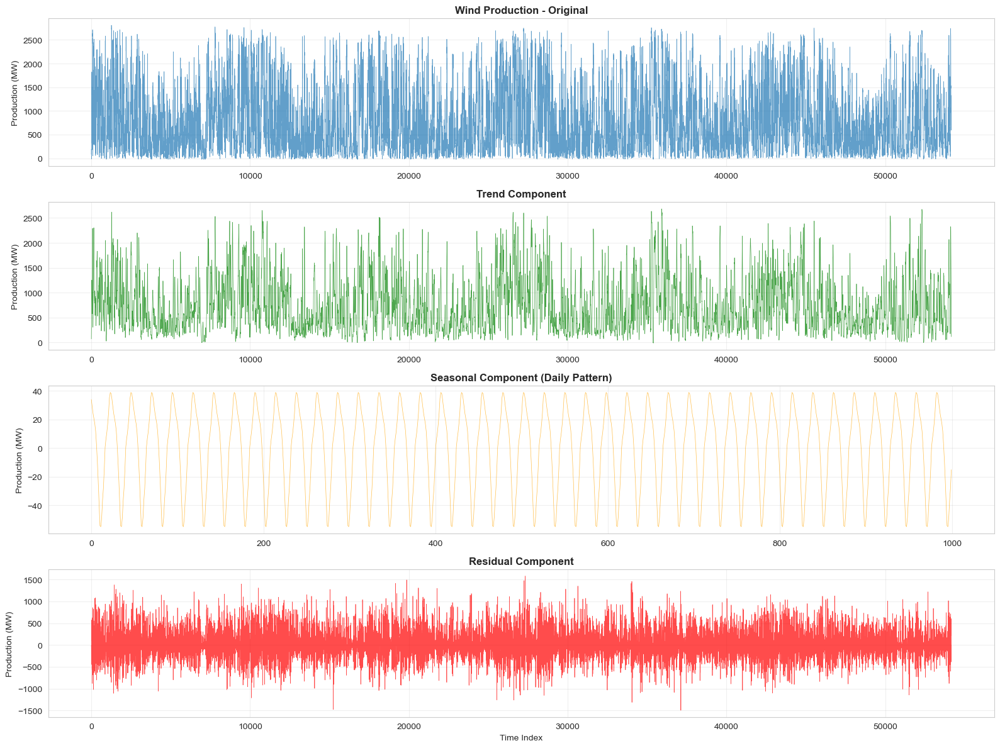

✓ Seasonal decomposition visualization saved to eda_plots/07_seasonal_decomposition.png


In [32]:
# Visualize seasonal decomposition components
# Plot decomposition for Wind (daily) as an example
if 'Wind_daily' in decompositions and decompositions['Wind_daily'] is not None:
    fig, axes = plt.subplots(4, 1, figsize=(16, 12))
    decomp = decompositions['Wind_daily']
    
    # Original
    axes[0].plot(decomp.observed, alpha=0.7, linewidth=0.5)
    axes[0].set_title('Wind Production - Original', fontweight='bold')
    axes[0].set_ylabel('Production (MW)')
    axes[0].grid(True, alpha=0.3)
    
    # Trend
    axes[1].plot(decomp.trend, alpha=0.7, linewidth=0.5, color='green')
    axes[1].set_title('Trend Component', fontweight='bold')
    axes[1].set_ylabel('Production (MW)')
    axes[1].grid(True, alpha=0.3)
    
    # Seasonal
    sample_size = min(1000, len(decomp.seasonal))
    axes[2].plot(decomp.seasonal.iloc[:sample_size], alpha=0.7, linewidth=0.5, color='orange')
    axes[2].set_title('Seasonal Component (Daily Pattern)', fontweight='bold')
    axes[2].set_ylabel('Production (MW)')
    axes[2].grid(True, alpha=0.3)
    
    # Residual
    axes[3].plot(decomp.resid, alpha=0.7, linewidth=0.5, color='red')
    axes[3].set_title('Residual Component', fontweight='bold')
    axes[3].set_ylabel('Production (MW)')
    axes[3].set_xlabel('Time Index')
    axes[3].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('eda_plots/07_seasonal_decomposition.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print("✓ Seasonal decomposition visualization saved to eda_plots/07_seasonal_decomposition.png")
else:
    print("⚠ Wind daily decomposition not available for visualization")


In [33]:
# Create deseasonalized variables
print("Creating deseasonalized variables...")

# For each variable, create deseasonalized versions using daily decomposition
for var in variables:
    if f'{var}_daily' in decompositions and decompositions[f'{var}_daily'] is not None:
        decomp = decompositions[f'{var}_daily']
        
        # Get the indices where decomposition was performed
        valid_idx = decomp.observed.index
        
        # Initialize deseasonalized columns
        df.loc[valid_idx, f'{var}_deseasonalized'] = decomp.trend + decomp.resid  # Original - Seasonal
        df.loc[valid_idx, f'{var}_trend'] = decomp.trend
        df.loc[valid_idx, f'{var}_seasonal'] = decomp.seasonal
        df.loc[valid_idx, f'{var}_residual'] = decomp.resid
        
        print(f"  ✓ Created deseasonalized features for {var}")
    else:
        print(f"  ✗ Could not create deseasonalized features for {var} (decomposition failed)")

print("\n✓ Deseasonalized variables created!")
print(f"\nNew columns created:")
deseasonalized_cols = [col for col in df.columns if any(x in col for x in ['_deseasonalized', '_trend', '_seasonal', '_residual'])]
print(f"  Total: {len(deseasonalized_cols)} columns")
for col in deseasonalized_cols:
    print(f"    - {col}")


Creating deseasonalized variables...
  ✓ Created deseasonalized features for Wind
  ✓ Created deseasonalized features for Hydroelectric
  ✓ Created deseasonalized features for Other_Production

✓ Deseasonalized variables created!

New columns created:
  Total: 12 columns
    - Wind_deseasonalized
    - Wind_trend
    - Wind_seasonal
    - Wind_residual
    - Hydroelectric_deseasonalized
    - Hydroelectric_trend
    - Hydroelectric_seasonal
    - Hydroelectric_residual
    - Other_Production_deseasonalized
    - Other_Production_trend
    - Other_Production_seasonal
    - Other_Production_residual


In [34]:
# Compare correlations: Original vs Deseasonalized
print("Comparing correlations: Original vs Deseasonalized")
print("=" * 60)

# Original correlations
wind_corr_orig, wind_p_orig = stats.pearsonr(
    df['Wind'].dropna(), 
    df['Other_Production'].dropna()
)
hydro_corr_orig, hydro_p_orig = stats.pearsonr(
    df['Hydroelectric'].dropna(), 
    df['Other_Production'].dropna()
)

print("\nOriginal Correlations:")
print(f"  Wind vs Other_Production: r = {wind_corr_orig:.4f}, p = {wind_p_orig:.4f}")
print(f"  Hydroelectric vs Other_Production: r = {hydro_corr_orig:.4f}, p = {hydro_p_orig:.4f}")

# Deseasonalized correlations (if available)
if 'Wind_deseasonalized' in df.columns and 'Other_Production_deseasonalized' in df.columns:
    wind_corr_deseas, wind_p_deseas = stats.pearsonr(
        df['Wind_deseasonalized'].dropna(), 
        df['Other_Production_deseasonalized'].dropna()
    )
    hydro_corr_deseas, hydro_p_deseas = stats.pearsonr(
        df['Hydroelectric_deseasonalized'].dropna(), 
        df['Other_Production_deseasonalized'].dropna()
    )
    
    print("\nDeseasonalized Correlations:")
    print(f"  Wind_deseasonalized vs Other_Production_deseasonalized: r = {wind_corr_deseas:.4f}, p = {wind_p_deseas:.4f}")
    print(f"  Hydroelectric_deseasonalized vs Other_Production_deseasonalized: r = {hydro_corr_deseas:.4f}, p = {hydro_p_deseas:.4f}")
    
    print("\nCorrelation Changes:")
    print(f"  Wind: {wind_corr_orig:.4f} → {wind_corr_deseas:.4f} (change: {wind_corr_deseas - wind_corr_orig:+.4f})")
    print(f"  Hydroelectric: {hydro_corr_orig:.4f} → {hydro_corr_deseas:.4f} (change: {hydro_corr_deseas - hydro_corr_orig:+.4f})")
else:
    print("\n⚠ Deseasonalized variables not available for correlation comparison")

print("\n✓ Correlation comparison completed!")


Comparing correlations: Original vs Deseasonalized

Original Correlations:
  Wind vs Other_Production: r = -0.0128, p = 0.0028
  Hydroelectric vs Other_Production: r = -0.2111, p = 0.0000

Deseasonalized Correlations:
  Wind_deseasonalized vs Other_Production_deseasonalized: r = -0.0065, p = 0.1276
  Hydroelectric_deseasonalized vs Other_Production_deseasonalized: r = -0.2668, p = 0.0000

Correlation Changes:
  Wind: -0.0128 → -0.0065 (change: +0.0063)
  Hydroelectric: -0.2111 → -0.2668 (change: -0.0557)

✓ Correlation comparison completed!


## 4.3 Create Deseasonalized Variables

**Purpose**: Create deseasonalized versions of key variables by removing seasonal components. These variables can be used in modeling to focus on relationships between variables rather than seasonal patterns.


## 4.4 Compare Correlations: Original vs Deseasonalized

**Purpose**: Compare correlations before and after deseasonalization to see if removing seasonality reveals stronger relationships between variables. This helps determine whether deseasonalization improves predictive power.


In [35]:
# Normality test (Shapiro-Wilk test, sample size limited to 5000)
print("Normality test results:")
for col in ['Wind', 'Hydroelectric', 'Other_Production']:
    sample = df[col].sample(min(5000, len(df)))
    stat, p_value = stats.shapiro(sample)
    print(f"{col}: statistic={stat:.4f}, p-value={p_value:.4f}, "
          f"{'Normal' if p_value > 0.05 else 'Not Normal'}")


Normality test results:
Wind: statistic=0.8957, p-value=0.0000, Not Normal
Hydroelectric: statistic=0.9557, p-value=0.0000, Not Normal
Other_Production: statistic=0.9920, p-value=0.0000, Not Normal


In [36]:
# Correlation significance tests
wind_corr, wind_p = stats.pearsonr(df['Wind'], df['Other_Production'])
hydro_corr, hydro_p = stats.pearsonr(df['Hydroelectric'], df['Other_Production'])

print(f"Wind vs Other_Production:")
print(f"  Correlation coefficient r = {wind_corr:.4f}")
print(f"  p-value = {wind_p:.4f}")
print(f"  Significance: {'Significant' if wind_p < 0.05 else 'Not significant'}\n")

print(f"Hydroelectric vs Other_Production:")
print(f"  Correlation coefficient r = {hydro_corr:.4f}")
print(f"  p-value = {hydro_p:.4f}")
print(f"  Significance: {'Significant' if hydro_p < 0.05 else 'Not significant'}")


Wind vs Other_Production:
  Correlation coefficient r = -0.0128
  p-value = 0.0028
  Significance: Significant

Hydroelectric vs Other_Production:
  Correlation coefficient r = -0.2111
  p-value = 0.0000
  Significance: Significant


## 5.3 Autocorrelation Analysis (Time Series)

**Purpose**: Measure how strongly a variable is correlated with its past values. High autocorrelation indicates strong temporal dependencies, which is important for time series modeling. This helps determine appropriate lag features and time series model types.


In [37]:
# Autocorrelation analysis (lag=1, 24, 168 for hourly data)
lags = [1, 24, 168]  # 1 hour, 24 hours (1 day), 168 hours (1 week)

for col in ['Wind', 'Hydroelectric', 'Other_Production']:
    autocorr = acf(df[col], nlags=max(lags), fft=True)
    print(f"\n{col} autocorrelation:")
    for lag in lags:
        if lag < len(autocorr):
            lag_name = '1 hour' if lag == 1 else '1 day' if lag == 24 else '1 week'
            print(f"  Lag {lag} ({lag_name}): {autocorr[lag]:.4f}")



Wind autocorrelation:
  Lag 1 (1 hour): 0.9766
  Lag 24 (1 day): 0.3127
  Lag 168 (1 week): 0.1150

Hydroelectric autocorrelation:
  Lag 1 (1 hour): 0.9648
  Lag 24 (1 day): 0.8741
  Lag 168 (1 week): 0.8169

Other_Production autocorrelation:
  Lag 1 (1 hour): 0.9853
  Lag 24 (1 day): 0.8834
  Lag 168 (1 week): 0.7943


# 6. Feature Engineering

**Purpose**: Create additional features that can improve model performance. Feature engineering transforms raw data into informative features that help machine learning models learn patterns more effectively. Good features can significantly improve prediction accuracy. This step comes after statistical tests to ensure we understand the data before creating features.

## 6.1 Manual Feature Engineering

**Purpose**: Manually create domain-specific features based on understanding of the problem. These features capture temporal patterns, interactions, and statistical properties that are known to be important for time series prediction.


In [40]:
# Comprehensive Manual Feature Engineering
print("=" * 60)
print("Manual Feature Engineering")
print("=" * 60)
print("\nCreating comprehensive manual features...")

# ============================================================================
# 1. Lag Features (Previous Time Steps)
# ============================================================================
print("\n1. Creating lag features...")
lag_periods = [1, 2, 3, 6, 12, 24, 48, 72, 168]  # 1h to 1 week
for lag in lag_periods:
    df[f'Wind_lag_{lag}'] = df['Wind'].shift(lag)
    df[f'Hydroelectric_lag_{lag}'] = df['Hydroelectric'].shift(lag)
    if 'Other_Production' in df.columns:
        df[f'Other_Production_lag_{lag}'] = df['Other_Production'].shift(lag)
print(f"  ✓ Created {len(lag_periods) * 3} lag features")

# ============================================================================
# 2. Rolling Window Statistics
# ============================================================================
print("\n2. Creating rolling window statistics...")
rolling_windows = [3, 6, 12, 24, 48, 72, 168]  # 3h to 1 week
for window in rolling_windows:
    # Mean
    df[f'Wind_rolling_mean_{window}'] = df['Wind'].rolling(window=window, min_periods=1).mean()
    df[f'Hydroelectric_rolling_mean_{window}'] = df['Hydroelectric'].rolling(window=window, min_periods=1).mean()
    # Std
    df[f'Wind_rolling_std_{window}'] = df['Wind'].rolling(window=window, min_periods=1).std()
    df[f'Hydroelectric_rolling_std_{window}'] = df['Hydroelectric'].rolling(window=window, min_periods=1).std()
    # Max
    df[f'Wind_rolling_max_{window}'] = df['Wind'].rolling(window=window, min_periods=1).max()
    df[f'Hydroelectric_rolling_max_{window}'] = df['Hydroelectric'].rolling(window=window, min_periods=1).max()
    # Min
    df[f'Wind_rolling_min_{window}'] = df['Wind'].rolling(window=window, min_periods=1).min()
    df[f'Hydroelectric_rolling_min_{window}'] = df['Hydroelectric'].rolling(window=window, min_periods=1).min()
    # Median
    df[f'Wind_rolling_median_{window}'] = df['Wind'].rolling(window=window, min_periods=1).median()
    df[f'Hydroelectric_rolling_median_{window}'] = df['Hydroelectric'].rolling(window=window, min_periods=1).median()
print(f"  ✓ Created {len(rolling_windows) * 5 * 2} rolling window features")

# ============================================================================
# 3. Exponential Moving Averages (EMA)
# ============================================================================
print("\n3. Creating exponential moving averages...")
ema_spans = [6, 12, 24, 48, 168]  # 6h to 1 week
for span in ema_spans:
    df[f'Wind_ema_{span}'] = df['Wind'].ewm(span=span, adjust=False).mean()
    df[f'Hydroelectric_ema_{span}'] = df['Hydroelectric'].ewm(span=span, adjust=False).mean()
    df[f'Wind_ema_std_{span}'] = df['Wind'].ewm(span=span, adjust=False).std()
    df[f'Hydroelectric_ema_std_{span}'] = df['Hydroelectric'].ewm(span=span, adjust=False).std()
print(f"  ✓ Created {len(ema_spans) * 4} EMA features")

# ============================================================================
# 4. Ratio and Interaction Features
# ============================================================================
print("\n4. Creating ratio and interaction features...")
# Ratios
df['Wind_Hydro_ratio'] = df['Wind'] / (df['Hydroelectric'] + 1e-6)
df['Hydro_Wind_ratio'] = df['Hydroelectric'] / (df['Wind'] + 1e-6)
# Sums
df['Wind_Hydro_sum'] = df['Wind'] + df['Hydroelectric']
df['Wind_Hydro_weighted_sum'] = 0.6 * df['Wind'] + 0.4 * df['Hydroelectric']
# Products
df['Wind_Hydro_product'] = df['Wind'] * df['Hydroelectric']
# Differences
df['Wind_Hydro_diff'] = df['Wind'] - df['Hydroelectric']
df['Wind_Hydro_abs_diff'] = np.abs(df['Wind'] - df['Hydroelectric'])
print("  ✓ Created 8 ratio and interaction features")

# ============================================================================
# 5. Percentage Change Features
# ============================================================================
print("\n5. Creating percentage change features...")
pct_change_periods = [1, 3, 6, 12, 24, 48, 168]
for period in pct_change_periods:
    df[f'Wind_pct_change_{period}'] = df['Wind'].pct_change(period)
    df[f'Hydroelectric_pct_change_{period}'] = df['Hydroelectric'].pct_change(period)
print(f"  ✓ Created {len(pct_change_periods) * 2} percentage change features")

# ============================================================================
# 6. Cyclical Encoding of Temporal Features (Sine/Cosine)
# ============================================================================
print("\n6. Creating cyclical temporal features...")
# Hour (0-23)
df['Hour_sin'] = np.sin(2 * np.pi * df['Hour'] / 24)
df['Hour_cos'] = np.cos(2 * np.pi * df['Hour'] / 24)
# Day of Week (0-6)
df['DayOfWeek_sin'] = np.sin(2 * np.pi * df['DayOfWeek'] / 7)
df['DayOfWeek_cos'] = np.cos(2 * np.pi * df['DayOfWeek'] / 7)
# Month (1-12)
df['Month_sin'] = np.sin(2 * np.pi * df['Month'] / 12)
df['Month_cos'] = np.cos(2 * np.pi * df['Month'] / 12)
# Day of Year (1-365)
df['DayOfYear_sin'] = np.sin(2 * np.pi * df['DayOfYear'] / 365)
df['DayOfYear_cos'] = np.cos(2 * np.pi * df['DayOfYear'] / 365)
print("  ✓ Created 8 cyclical temporal features")

# ============================================================================
# 7. Binary Categorical Features
# ============================================================================
print("\n7. Creating binary categorical features...")
# Weekend/Weekday
df['Is_Weekend'] = (df['DayOfWeek'] >= 5).astype(int)
df['Is_Weekday'] = (df['DayOfWeek'] < 5).astype(int)
# Time of day
df['Is_Night'] = ((df['Hour'] >= 22) | (df['Hour'] < 6)).astype(int)
df['Is_Day'] = ((df['Hour'] >= 6) & (df['Hour'] < 18)).astype(int)
df['Is_Evening'] = ((df['Hour'] >= 18) & (df['Hour'] < 22)).astype(int)
df['Is_Morning'] = ((df['Hour'] >= 6) & (df['Hour'] < 12)).astype(int)
df['Is_Afternoon'] = ((df['Hour'] >= 12) & (df['Hour'] < 18)).astype(int)
# Seasons
df['Is_Spring'] = df['Month'].isin([3, 4, 5]).astype(int)
df['Is_Summer'] = df['Month'].isin([6, 7, 8]).astype(int)
df['Is_Autumn'] = df['Month'].isin([9, 10, 11]).astype(int)
df['Is_Winter'] = df['Month'].isin([12, 1, 2]).astype(int)
print("  ✓ Created 13 binary categorical features")

# ============================================================================
# 8. Statistical Features Over Different Windows
# ============================================================================
print("\n8. Creating statistical features...")
stat_windows = [24, 168]  # Daily and weekly
for window in stat_windows:
    # Skewness
    df[f'Wind_skew_{window}'] = df['Wind'].rolling(window=window, min_periods=1).skew()
    df[f'Hydroelectric_skew_{window}'] = df['Hydroelectric'].rolling(window=window, min_periods=1).skew()
    # Kurtosis
    df[f'Wind_kurt_{window}'] = df['Wind'].rolling(window=window, min_periods=1).kurt()
    df[f'Hydroelectric_kurt_{window}'] = df['Hydroelectric'].rolling(window=window, min_periods=1).kurt()
    # Range
    df[f'Wind_range_{window}'] = df[f'Wind_rolling_max_{window}'] - df[f'Wind_rolling_min_{window}']
    df[f'Hydroelectric_range_{window}'] = df[f'Hydroelectric_rolling_max_{window}'] - df[f'Hydroelectric_rolling_min_{window}']
print(f"  ✓ Created {len(stat_windows) * 6} statistical features")

# ============================================================================
# 9. Normalized Temporal Features
# ============================================================================
print("\n9. Creating normalized temporal features...")
df['Hour_of_day_norm'] = df['Hour'] / 24
df['Day_of_week_norm'] = df['DayOfWeek'] / 7
df['Day_of_month_norm'] = df['Day'] / 31
df['Month_norm'] = df['Month'] / 12
df['Day_of_year_norm'] = df['DayOfYear'] / 365
print("  ✓ Created 5 normalized temporal features")

# ============================================================================
# 10. Energy Mix Features
# ============================================================================
print("\n10. Creating energy mix features...")
if 'Production' in df.columns:
    df['Renewable_ratio'] = (df['Wind'] + df['Hydroelectric'] + df.get('Solar', 0)) / (df['Production'] + 1e-6)
    df['Fossil_ratio'] = (df.get('Oil and Gas', 0) + df.get('Coal', 0)) / (df['Production'] + 1e-6)
    df['Wind_ratio'] = df['Wind'] / (df['Production'] + 1e-6)
    df['Hydroelectric_ratio'] = df['Hydroelectric'] / (df['Production'] + 1e-6)
    print("  ✓ Created 4 energy mix features")

# ============================================================================
# 11. Expanding Window Features
# ============================================================================
print("\n11. Creating expanding window features...")
df['Wind_expanding_mean'] = df['Wind'].expanding().mean()
df['Wind_expanding_std'] = df['Wind'].expanding().std()
df['Hydroelectric_expanding_mean'] = df['Hydroelectric'].expanding().mean()
df['Hydroelectric_expanding_std'] = df['Hydroelectric'].expanding().std()
print("  ✓ Created 4 expanding window features")

# ============================================================================
# 12. Difference Features
# ============================================================================
print("\n12. Creating difference features...")
diff_periods = [1, 24, 168]
for period in diff_periods:
    df[f'Wind_diff_{period}'] = df['Wind'].diff(period)
    df[f'Hydroelectric_diff_{period}'] = df['Hydroelectric'].diff(period)
print(f"  ✓ Created {len(diff_periods) * 2} difference features")

# ============================================================================
# Summary
# ============================================================================
print("\n" + "=" * 60)
print("Manual Feature Engineering Summary")
print("=" * 60)
total_features = len([col for col in df.columns if col not in ['DateTime', 'Year', 'Month', 'Day', 'Hour', 'DayOfWeek', 'DayOfYear']])
engineered_features = [col for col in df.columns if any(x in col for x in [
    'lag', 'rolling', 'ema', 'ratio', '_sin', '_cos', 'Is_', 'pct_change', 
    'diff', 'expanding', 'skew', 'kurt', 'range', '_norm'
])]
print(f"Total features in dataset: {total_features}")
print(f"Engineered features created: {len(engineered_features)}")
print(f"\nFirst 20 engineered features:")
for i, feat in enumerate(engineered_features[:20], 1):
    print(f"  {i}. {feat}")
if len(engineered_features) > 20:
    print(f"  ... and {len(engineered_features) - 20} more features")
print("\n✓ Manual feature engineering completed!")


Manual Feature Engineering

Creating comprehensive manual features...

1. Creating lag features...
  ✓ Created 27 lag features

2. Creating rolling window statistics...
  ✓ Created 70 rolling window features

3. Creating exponential moving averages...
  ✓ Created 20 EMA features

4. Creating ratio and interaction features...
  ✓ Created 8 ratio and interaction features

5. Creating percentage change features...
  ✓ Created 14 percentage change features

6. Creating cyclical temporal features...
  ✓ Created 8 cyclical temporal features

7. Creating binary categorical features...
  ✓ Created 13 binary categorical features

8. Creating statistical features...
  ✓ Created 12 statistical features

9. Creating normalized temporal features...
  ✓ Created 5 normalized temporal features

10. Creating energy mix features...
  ✓ Created 4 energy mix features

11. Creating expanding window features...
  ✓ Created 4 expanding window features

12. Creating difference features...
  ✓ Created 6 differ

## 6.2 Automated Feature Engineering

**Purpose**: Use automated feature engineering tools to generate features systematically. These tools can discover complex feature interactions and transformations that might not be obvious, potentially improving model performance. We use tsfresh for time series feature extraction as it's specifically designed for time series data.


In [41]:
# Automated Feature Engineering using tsfresh
# tsfresh is specifically designed for time series feature extraction
print("=" * 60)
print("Automated Feature Engineering using tsfresh")
print("=" * 60)

try:
    from tsfresh import extract_features, select_features
    from tsfresh.utilities.dataframe_functions import impute
    from tsfresh.feature_extraction import ComprehensiveFCParameters, MinimalFCParameters
    
    print("\nUsing tsfresh for time series feature extraction...")
    print("Note: This may take several minutes for large datasets.")
    
    # Prepare data for tsfresh
    # tsfresh requires data in a specific format: (id, time, value)
    # We'll extract features for Wind and Hydroelectric separately
    
    # Sample data if too large (tsfresh can be slow on very large datasets)
    sample_size = min(10000, len(df))
    df_sample = df.iloc[:sample_size].copy()
    
    # Extract features for Wind
    print("\n1. Extracting features for Wind...")
    wind_data = pd.DataFrame({
        'id': range(len(df_sample)),
        'time': range(len(df_sample)),
        'value': df_sample['Wind'].values
    })
    
    # Use minimal feature set for faster computation (can use ComprehensiveFCParameters for more features)
    wind_features = extract_features(
        wind_data,
        column_id='id',
        column_sort='time',
        column_value='value',
        default_fc_parameters=MinimalFCParameters(),  # Use minimal for speed, change to ComprehensiveFCParameters() for more features
        impute_function=impute,
        disable_progressbar=False
    )
    print(f"  ✓ Extracted {wind_features.shape[1]} features for Wind")
    
    # Rename columns to avoid conflicts
    wind_features.columns = [f'Wind_tsfresh_{col}' for col in wind_features.columns]
    
    # Extract features for Hydroelectric
    print("\n2. Extracting features for Hydroelectric...")
    hydro_data = pd.DataFrame({
        'id': range(len(df_sample)),
        'time': range(len(df_sample)),
        'value': df_sample['Hydroelectric'].values
    })
    
    hydro_features = extract_features(
        hydro_data,
        column_id='id',
        column_sort='time',
        column_value='value',
        default_fc_parameters=MinimalFCParameters(),
        impute_function=impute,
        disable_progressbar=False
    )
    print(f"  ✓ Extracted {hydro_features.shape[1]} features for Hydroelectric")
    
    # Rename columns
    hydro_features.columns = [f'Hydroelectric_tsfresh_{col}' for col in hydro_features.columns]
    
    # Combine features
    tsfresh_features = pd.concat([wind_features, hydro_features], axis=1)
    
    # Align with original dataframe
    tsfresh_features.index = df_sample.index
    
    # Add tsfresh features to dataframe (only for sampled rows, others will be NaN)
    for col in tsfresh_features.columns:
        df[col] = np.nan
        df.loc[df_sample.index, col] = tsfresh_features[col].values
    
    print(f"\n✓ Total tsfresh features created: {len(tsfresh_features.columns)}")
    print(f"  - Wind features: {len(wind_features.columns)}")
    print(f"  - Hydroelectric features: {len(hydro_features.columns)}")
    print(f"\nNote: tsfresh features are only available for the first {sample_size} rows.")
    print("      For full dataset, remove the sampling or use a more powerful machine.")
    
    # Display sample of feature names
    print(f"\nSample tsfresh features (first 10):")
    for i, feat in enumerate(tsfresh_features.columns[:10], 1):
        print(f"  {i}. {feat}")
    
    tsfresh_success = True
    
except ImportError:
    print("✗ tsfresh not installed. Install with: pip install tsfresh")
    print("  tsfresh is a powerful tool for automatic time series feature extraction.")
    tsfresh_success = False
except Exception as e:
    print(f"✗ Error with tsfresh: {e}")
    print("  This may be due to dataset size or memory constraints.")
    print("  Consider using a smaller sample or more powerful hardware.")
    tsfresh_success = False

print("\n✓ Automated feature engineering completed!")


Automated Feature Engineering using tsfresh

Using tsfresh for time series feature extraction...
Note: This may take several minutes for large datasets.

1. Extracting features for Wind...


Feature Extraction: 100%|████████████████| 25/25 [00:05<00:00,  4.82it/s]


  ✓ Extracted 10 features for Wind

2. Extracting features for Hydroelectric...


Feature Extraction: 100%|████████████████| 25/25 [00:03<00:00,  6.40it/s]

  ✓ Extracted 10 features for Hydroelectric

✓ Total tsfresh features created: 20
  - Wind features: 10
  - Hydroelectric features: 10

Note: tsfresh features are only available for the first 10000 rows.
      For full dataset, remove the sampling or use a more powerful machine.

Sample tsfresh features (first 10):
  1. Wind_tsfresh_value__sum_values
  2. Wind_tsfresh_value__median
  3. Wind_tsfresh_value__mean
  4. Wind_tsfresh_value__length
  5. Wind_tsfresh_value__standard_deviation
  6. Wind_tsfresh_value__variance
  7. Wind_tsfresh_value__root_mean_square
  8. Wind_tsfresh_value__maximum
  9. Wind_tsfresh_value__absolute_maximum
  10. Wind_tsfresh_value__minimum

✓ Automated feature engineering completed!


## 5.2 Automated Feature Engineering

**Purpose**: Use automated feature engineering tools to generate features systematically. These tools can discover complex feature interactions and transformations that might not be obvious, potentially improving model performance.


# 6. Statistical Tests

**Purpose**: Perform statistical tests to validate assumptions and understand data properties. These tests help determine appropriate modeling approaches (e.g., whether data is normally distributed affects model choice) and validate relationships between variables.

## 6.1 Normality Tests

**Purpose**: Test if variables follow a normal distribution. This is important because many statistical methods and models assume normality. If data is not normal, we may need to use non-parametric methods or transform the data.


In [42]:
# Correlation significance tests
wind_corr, wind_p = stats.pearsonr(df['Wind'], df['Other_Production'])
hydro_corr, hydro_p = stats.pearsonr(df['Hydroelectric'], df['Other_Production'])

print(f"Wind vs Other_Production:")
print(f"  Correlation coefficient r = {wind_corr:.4f}")
print(f"  p-value = {wind_p:.4f}")
print(f"  Significance: {'Significant' if wind_p < 0.05 else 'Not significant'}\n")

print(f"Hydroelectric vs Other_Production:")
print(f"  Correlation coefficient r = {hydro_corr:.4f}")
print(f"  p-value = {hydro_p:.4f}")
print(f"  Significance: {'Significant' if hydro_p < 0.05 else 'Not significant'}")


Wind vs Other_Production:
  Correlation coefficient r = -0.0128
  p-value = 0.0028
  Significance: Significant

Hydroelectric vs Other_Production:
  Correlation coefficient r = -0.2111
  p-value = 0.0000
  Significance: Significant


## 6.3 Autocorrelation Analysis (Time Series)

**Purpose**: Measure how strongly a variable is correlated with its past values. High autocorrelation indicates strong temporal dependencies, which is important for time series modeling. This helps determine appropriate lag features and time series model types.


In [29]:
# Autocorrelation analysis (lag=1, 24, 168 for hourly data)
lags = [1, 24, 168]  # 1 hour, 24 hours (1 day), 168 hours (1 week)

for col in ['Wind', 'Hydroelectric', 'Other_Production']:
    autocorr = acf(df[col], nlags=max(lags), fft=True)
    print(f"\n{col} autocorrelation:")
    for lag in lags:
        if lag < len(autocorr):
            lag_name = '1 hour' if lag == 1 else '1 day' if lag == 24 else '1 week'
            print(f"  Lag {lag} ({lag_name}): {autocorr[lag]:.4f}")



Wind autocorrelation:
  Lag 1 (1 hour): 0.9766
  Lag 24 (1 day): 0.3127
  Lag 168 (1 week): 0.1150

Hydroelectric autocorrelation:
  Lag 1 (1 hour): 0.9648
  Lag 24 (1 day): 0.8741
  Lag 168 (1 week): 0.8169

Other_Production autocorrelation:
  Lag 1 (1 hour): 0.9853
  Lag 24 (1 day): 0.8834
  Lag 168 (1 week): 0.7943


# 7. Data Quality Check

**Purpose**: Identify and assess data quality issues such as outliers, missing values, and anomalies. Understanding data quality helps determine appropriate preprocessing steps and can reveal potential problems that might affect model performance.

## 7.1 Outlier Detection

**Purpose**: Identify extreme values that may be errors or represent unusual events. Outliers can significantly impact model performance, so it's important to detect them and decide whether to remove, transform, or handle them appropriately.


In [30]:
# Outlier detection using IQR method
print("Outlier detection results (IQR method):")
for col in ['Wind', 'Hydroelectric', 'Other_Production']:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = ((df[col] < lower_bound) | (df[col] > upper_bound)).sum()
    print(f"\n{col}:")
    print(f"  Q1={Q1:.2f}, Q3={Q3:.2f}, IQR={IQR:.2f}")
    print(f"  Number of outliers: {outliers} ({outliers/len(df)*100:.2f}%)")
    print(f"  Outlier range: < {lower_bound:.2f} or > {upper_bound:.2f}")


Outlier detection results (IQR method):

Wind:
  Q1=228.00, Q3=1167.00, IQR=939.00
  Number of outliers: 456 (0.84%)
  Outlier range: < -1180.50 or > 2575.50

Hydroelectric:
  Q1=1281.00, Q3=2191.00, IQR=910.00
  Number of outliers: 914 (1.69%)
  Outlier range: < -84.00 or > 3556.00

Other_Production:
  Q1=3393.00, Q3=4283.00, IQR=890.00
  Number of outliers: 648 (1.20%)
  Outlier range: < 2058.00 or > 5618.00


# 8. AutoML - Machine Learning Modeling

**Purpose**: Use AutoGluon to automatically build, train, and optimize machine learning models. AutoML automates the entire machine learning pipeline including model selection, hyperparameter tuning, and ensemble creation, saving significant time while often achieving competitive or superior performance compared to manual modeling.

**Problem**: Predict Other_Production (sum of Nuclear, Oil and Gas, Coal, Solar, and Biomass) using Wind and Hydroelectric power production as features.

## 8.1 Data Preparation for Modeling

**Purpose**: Prepare the data for machine learning by selecting features, handling missing values, and splitting into training and testing sets. Proper data preparation is crucial for model performance and prevents data leakage.


In [43]:
# Prepare data for machine learning
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import warnings
warnings.filterwarnings('ignore')

# Select features - using Wind, Hydroelectric, and engineered features
# Exclude DateTime and target variable
exclude_cols = ['DateTime', 'Other_Production', 'Production', 'Consumption', 
                'Nuclear', 'Oil and Gas', 'Coal', 'Solar', 'Biomass',
                'Production_Check', 'Production_Diff']

# Get feature columns (exclude non-feature columns and handle NaN)
feature_cols = [col for col in df.columns if col not in exclude_cols]

# Remove columns with too many NaN values (>50%)
valid_cols = []
for col in feature_cols:
    if df[col].isna().sum() / len(df) < 0.5:
        valid_cols.append(col)

print(f"Total features available: {len(valid_cols)}")
print(f"Features excluded due to high NaN: {len(feature_cols) - len(valid_cols)}")

# Prepare X and y
X = df[valid_cols].copy()
y = df['Other_Production'].copy()

# Handle NaN values - fill with median for numeric columns
for col in X.columns:
    if X[col].dtype in ['float64', 'int64']:
        X[col] = X[col].fillna(X[col].median())
    else:
        X[col] = X[col].fillna(0)

# Split data into train and test sets (80-20 split, maintaining temporal order)
split_idx = int(len(X) * 0.8)
X_train = X.iloc[:split_idx].copy()
X_test = X.iloc[split_idx:].copy()
y_train = y.iloc[:split_idx].copy()
y_test = y.iloc[split_idx:].copy()

print(f"\nData split:")
print(f"Training set: {len(X_train)} samples")
print(f"Test set: {len(X_test)} samples")
print(f"Features: {X_train.shape[1]}")

# Display basic statistics
print(f"\nTarget variable statistics:")
print(f"Train - Mean: {y_train.mean():.2f}, Std: {y_train.std():.2f}")
print(f"Test - Mean: {y_test.mean():.2f}, Std: {y_test.std():.2f}")


Total features available: 208
Features excluded due to high NaN: 20

Data split:
Training set: 43336 samples
Test set: 10834 samples
Features: 208

Target variable statistics:
Train - Mean: 3859.81, Std: 691.05
Test - Mean: 3633.64, Std: 632.76


## 8.2 Using AutoGluon

**Purpose**: AutoGluon automatically selects the best models, tunes hyperparameters, and creates ensembles. It handles feature preprocessing, model selection, and optimization, making it ideal for quickly building high-performing models without extensive manual tuning.


In [ ]:
# Method: AutoGluon - Fast and powerful AutoML
try:
    from autogluon.tabular import TabularPredictor
    
    print("=" * 60)
    print("Using AutoGluon for AutoML")
    print("=" * 60)
    
    # Prepare data for AutoGluon
    train_data = X_train.copy()
    train_data['Other_Production'] = y_train.values
    
    # Initialize predictor
    print("\nTraining AutoGluon model (this may take several minutes)...")
    predictor = TabularPredictor(
        label='Other_Production',
        problem_type='regression',
        eval_metric='root_mean_squared_error'
    ).fit(
        train_data,
        time_limit=600,  # 10 minutes
        presets='best_quality'  # Use best quality preset
    )
    
    # Make predictions
    y_pred_autogluon = predictor.predict(X_test)
    
    # Calculate metrics
    rmse_autogluon = np.sqrt(mean_squared_error(y_test, y_pred_autogluon))
    mae_autogluon = mean_absolute_error(y_test, y_pred_autogluon)
    r2_autogluon = r2_score(y_test, y_pred_autogluon)
    
    print(f"\n✓ AutoGluon Results:")
    print(f"  RMSE: {rmse_autogluon:.2f}")
    print(f"  MAE: {mae_autogluon:.2f}")
    print(f"  R² Score: {r2_autogluon:.4f}")
    
    # Get leaderboard
    print("\nModel Leaderboard:")
    leaderboard = predictor.leaderboard(silent=True)
    print(leaderboard.head(10))
    
    # Feature importance
    print("\nTop 10 Most Important Features:")
    feature_importance = predictor.feature_importance(train_data)
    print(feature_importance.head(10))
    
    autogluon_results = {
        'rmse': rmse_autogluon,
        'mae': mae_autogluon,
        'r2': r2_autogluon,
        'predictions': y_pred_autogluon,
        'predictor': predictor
    }
    
except ImportError:
    print("✗ AutoGluon not installed. Install with: pip install autogluon")
    autogluon_results = None
except Exception as e:
    print(f"✗ Error with AutoGluon: {e}")
    autogluon_results = None


No path specified. Models will be saved in: "AutogluonModels/ag-20260115_174459"
Verbosity: 2 (Standard Logging)


Using AutoGluon for AutoML

Training AutoGluon model (this may take several minutes)...


=================== System Info ===================
AutoGluon Version:  1.5.0
Python Version:     3.13.7
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 25.2.0: Tue Nov 18 21:08:48 PST 2025; root:xnu-12377.61.12~1/RELEASE_ARM64_T8132
CPU Count:          10
Pytorch Version:    2.9.1
CUDA Version:       CUDA is not available
GPU Count:          WARNING: Exception was raised when calculating GPU count (AssertionError)
Memory Avail:       2.93 GB / 16.00 GB (18.3%)
Disk Space Avail:   91.52 GB / 460.43 GB (19.9%)
Presets specified: ['best_quality']
Using hyperparameters preset: hyperparameters='zeroshot'
Setting dynamic_stacking from 'auto' to True. Reason: Enable dynamic_stacking when use_bag_holdout is disabled. (use_bag_holdout=False)
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=1
DyStack is enabled (dynamic_stacking=True). AutoGluon will try to determine whether the input data is affected by stac


✓ AutoGluon Results:
  RMSE: 41.35
  MAE: 24.62
  R² Score: 0.9957

Model Leaderboard:
                 model  score_val              eval_metric  pred_time_val  \
0  WeightedEnsemble_L2 -15.305763  root_mean_squared_error      26.614557   
1    LightGBMXT_BAG_L1 -18.126468  root_mean_squared_error      25.036324   
2      LightGBM_BAG_L1 -18.742672  root_mean_squared_error       1.576125   

     fit_time  pred_time_val_marginal  fit_time_marginal  stack_level  \
0  425.708886                0.002108           0.051354            2   
1  365.422845               25.036324         365.422845            1   
2   60.234687                1.576125          60.234687            1   

   can_infer  fit_order  
0       True          3  
1       True          1  
2       True          2  

Top 10 Most Important Features:


	5192.18s	= Expected runtime (1038.44s per shuffle set)


## 8.3 Model Evaluation and Visualization

**Purpose**: Evaluate model performance using multiple metrics and visualize predictions. This helps understand how well the model performs, identify areas for improvement, and validate that the model makes reasonable predictions. Visualizations help communicate results and identify systematic errors.


In [ ]:
# Visualize AutoGluon model results
if autogluon_results:
    y_pred_best = autogluon_results['predictions']
    
    # Sample for visualization (if too many points)
    sample_size = min(1000, len(y_test))
    sample_idx = np.random.choice(len(y_test), sample_size, replace=False)
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    # 1. Scatter plot: Predicted vs Actual
    axes[0, 0].scatter(y_test.iloc[sample_idx], y_pred_best[sample_idx], alpha=0.5, s=10)
    axes[0, 0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
    axes[0, 0].set_xlabel('Actual Other_Production (MW)')
    axes[0, 0].set_ylabel('Predicted Other_Production (MW)')
    axes[0, 0].set_title('Predicted vs Actual (AutoGluon)', fontweight='bold')
    axes[0, 0].grid(True, alpha=0.3)
    
    # 2. Residual plot
    residuals = y_test.values - y_pred_best
    axes[0, 1].scatter(y_pred_best[sample_idx], residuals[sample_idx], alpha=0.5, s=10)
    axes[0, 1].axhline(y=0, color='r', linestyle='--', lw=2)
    axes[0, 1].set_xlabel('Predicted Other_Production (MW)')
    axes[0, 1].set_ylabel('Residuals (MW)')
    axes[0, 1].set_title('Residual Plot', fontweight='bold')
    axes[0, 1].grid(True, alpha=0.3)
    
    # 3. Time series comparison (sample)
    time_sample = min(500, len(y_test))
    axes[1, 0].plot(range(time_sample), y_test.iloc[:time_sample].values, 
                  label='Actual', alpha=0.7, linewidth=1)
    axes[1, 0].plot(range(time_sample), y_pred_best[:time_sample], 
                  label='Predicted', alpha=0.7, linewidth=1)
    axes[1, 0].set_xlabel('Time Index')
    axes[1, 0].set_ylabel('Other_Production (MW)')
    axes[1, 0].set_title('Time Series: Actual vs Predicted (Sample)', fontweight='bold')
    axes[1, 0].legend()
    axes[1, 0].grid(True, alpha=0.3)
    
    # 4. Error distribution
    axes[1, 1].hist(residuals, bins=50, alpha=0.7, edgecolor='black')
    axes[1, 1].axvline(x=0, color='r', linestyle='--', lw=2)
    axes[1, 1].set_xlabel('Residuals (MW)')
    axes[1, 1].set_ylabel('Frequency')
    axes[1, 1].set_title('Residual Distribution', fontweight='bold')
    axes[1, 1].grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    plt.savefig('eda_plots/08_automl_predictions.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"\nPrediction Statistics for AutoGluon:")
    print(f"  RMSE: {autogluon_results['rmse']:.2f} MW")
    print(f"  MAE: {autogluon_results['mae']:.2f} MW")
    print(f"  R² Score: {autogluon_results['r2']:.4f}")
    print(f"  Mean Residual: {np.mean(residuals):.2f} MW")
    print(f"  Std of Residuals: {np.std(residuals):.2f} MW")
else:
    print("AutoGluon model not available. Please install AutoGluon and run the previous cell.")


In [ ]:
# Calculate correlations for summary (if not already calculated)
try:
    wind_corr, wind_p = stats.pearsonr(df['Wind'], df['Other_Production'])
    hydro_corr, hydro_p = stats.pearsonr(df['Hydroelectric'], df['Other_Production'])
except:
    wind_corr, wind_p = 0, 1
    hydro_corr, hydro_p = 0, 1

print("=" * 80)
print("EDA Summary Report")
print("=" * 80)
print(f"""
Data Overview:
- Total records: {len(df):,}
- Time span: {df['DateTime'].min()} to {df['DateTime'].max()}
- Time interval: Hourly

Key Variables Statistics:
- Wind:
  * Mean: {df['Wind'].mean():.2f} MW
  * Std: {df['Wind'].std():.2f} MW
  * Range: [{df['Wind'].min():.2f}, {df['Wind'].max():.2f}] MW
  
- Hydroelectric:
  * Mean: {df['Hydroelectric'].mean():.2f} MW
  * Std: {df['Hydroelectric'].std():.2f} MW
  * Range: [{df['Hydroelectric'].min():.2f}, {df['Hydroelectric'].max():.2f}] MW

- Other_Production (Target Variable):
  * Mean: {df['Other_Production'].mean():.2f} MW
  * Std: {df['Other_Production'].std():.2f} MW
  * Range: [{df['Other_Production'].min():.2f}, {df['Other_Production'].max():.2f}] MW

Correlation Analysis:
- Wind vs Other_Production: {wind_corr:.4f} (p={wind_p:.4f})
- Hydroelectric vs Other_Production: {hydro_corr:.4f} (p={hydro_p:.4f})

Data Quality:
- Missing values: {'None' if df.isnull().sum().sum() == 0 else 'Present'}
- Negative values: Wind has {(df['Wind'] < 0).sum()} negative values, 
                   Hydroelectric has {(df['Hydroelectric'] < 0).sum()} negative values

Feature Engineering:
- Manual features created: {len([col for col in df.columns if any(x in col for x in ['lag', 'rolling', 'ema', 'ratio', '_sin', '_cos', 'Is_', 'pct_change'])])}
- Total features in dataset: {len(df.columns)}

Visualization charts saved to eda_plots/ directory:
  01_time_series.png - Time series plots
  02_distributions.png - Distribution plots
  03_correlation_heatmap.png - Correlation heatmap
  04_scatter_matrix.png - Scatter plot matrix
  05_temporal_patterns.png - Temporal patterns analysis
  06_energy_composition.png - Energy composition analysis
  07_seasonal_decomposition.png - Seasonal decomposition

Automated EDA reports (if generated):
  automated_report_ydata_profiling.html - ydata-profiling report
  automated_report_sweetviz.html - sweetviz report
  automated_report_dataprep.html - dataprep report
""")
print("=" * 80)
print("EDA Analysis Complete!")
print("=" * 80)


In [ ]:
# Manual feature engineering - creating various features that might be useful for prediction

print("Creating manual features...")

# 1. Lag features (previous time steps)
for lag in [1, 2, 3, 6, 12, 24]:  # 1h, 2h, 3h, 6h, 12h, 24h ago
    df[f'Wind_lag_{lag}'] = df['Wind'].shift(lag)
    df[f'Hydroelectric_lag_{lag}'] = df['Hydroelectric'].shift(lag)

# 2. Rolling window statistics
for window in [3, 6, 12, 24, 168]:  # 3h, 6h, 12h, 24h, 1 week
    df[f'Wind_rolling_mean_{window}'] = df['Wind'].rolling(window=window, min_periods=1).mean()
    df[f'Wind_rolling_std_{window}'] = df['Wind'].rolling(window=window, min_periods=1).std()
    df[f'Hydroelectric_rolling_mean_{window}'] = df['Hydroelectric'].rolling(window=window, min_periods=1).mean()
    df[f'Hydroelectric_rolling_std_{window}'] = df['Hydroelectric'].rolling(window=window, min_periods=1).std()

# 3. Exponential moving averages
for span in [6, 12, 24]:
    df[f'Wind_ema_{span}'] = df['Wind'].ewm(span=span, adjust=False).mean()
    df[f'Hydroelectric_ema_{span}'] = df['Hydroelectric'].ewm(span=span, adjust=False).mean()

# 4. Ratio and interaction features
df['Wind_Hydro_ratio'] = df['Wind'] / (df['Hydroelectric'] + 1e-6)  # Add small value to avoid division by zero
df['Wind_Hydro_sum'] = df['Wind'] + df['Hydroelectric']
df['Wind_Hydro_product'] = df['Wind'] * df['Hydroelectric']
df['Wind_Hydro_diff'] = df['Wind'] - df['Hydroelectric']

# 5. Percentage change features
df['Wind_pct_change_1h'] = df['Wind'].pct_change(1)
df['Wind_pct_change_24h'] = df['Wind'].pct_change(24)
df['Hydroelectric_pct_change_1h'] = df['Hydroelectric'].pct_change(1)
df['Hydroelectric_pct_change_24h'] = df['Hydroelectric'].pct_change(24)

# 6. Cyclical encoding of temporal features (sine/cosine transformation)
df['Hour_sin'] = np.sin(2 * np.pi * df['Hour'] / 24)
df['Hour_cos'] = np.cos(2 * np.pi * df['Hour'] / 24)
df['DayOfWeek_sin'] = np.sin(2 * np.pi * df['DayOfWeek'] / 7)
df['DayOfWeek_cos'] = np.cos(2 * np.pi * df['DayOfWeek'] / 7)
df['Month_sin'] = np.sin(2 * np.pi * df['Month'] / 12)
df['Month_cos'] = np.cos(2 * np.pi * df['Month'] / 12)
df['DayOfYear_sin'] = np.sin(2 * np.pi * df['DayOfYear'] / 365)
df['DayOfYear_cos'] = np.cos(2 * np.pi * df['DayOfYear'] / 365)

# 7. Is weekend / is weekday
df['Is_Weekend'] = (df['DayOfWeek'] >= 5).astype(int)
df['Is_Weekday'] = (df['DayOfWeek'] < 5).astype(int)

# 8. Time of day categories
df['Is_Night'] = ((df['Hour'] >= 22) | (df['Hour'] < 6)).astype(int)
df['Is_Day'] = ((df['Hour'] >= 6) & (df['Hour'] < 18)).astype(int)
df['Is_Evening'] = ((df['Hour'] >= 18) & (df['Hour'] < 22)).astype(int)

# 9. Season features
df['Is_Spring'] = df['Month'].isin([3, 4, 5]).astype(int)
df['Is_Summer'] = df['Month'].isin([6, 7, 8]).astype(int)
df['Is_Autumn'] = df['Month'].isin([9, 10, 11]).astype(int)
df['Is_Winter'] = df['Month'].isin([12, 1, 2]).astype(int)

# 10. Statistical features over different windows
for window in [24, 168]:  # Daily and weekly
    df[f'Wind_max_{window}'] = df['Wind'].rolling(window=window, min_periods=1).max()
    df[f'Wind_min_{window}'] = df['Wind'].rolling(window=window, min_periods=1).min()
    df[f'Hydroelectric_max_{window}'] = df['Hydroelectric'].rolling(window=window, min_periods=1).max()
    df[f'Hydroelectric_min_{window}'] = df['Hydroelectric'].rolling(window=window, min_periods=1).min()

# 11. Relative position in day/week/month
df['Hour_of_day_norm'] = df['Hour'] / 24
df['Day_of_week_norm'] = df['DayOfWeek'] / 7
df['Day_of_month_norm'] = df['Day'] / 31
df['Month_norm'] = df['Month'] / 12

# 12. Energy mix features
df['Renewable_ratio'] = (df['Wind'] + df['Hydroelectric'] + df['Solar']) / (df['Production'] + 1e-6)
df['Fossil_ratio'] = (df['Oil and Gas'] + df['Coal']) / (df['Production'] + 1e-6)

print(f"Manual feature engineering completed!")
print(f"Total features created: {len([col for col in df.columns if col not in ['DateTime', 'Year', 'Month', 'Day', 'Hour', 'DayOfWeek', 'DayOfYear']])}")
print(f"\nSample of new features:")
new_features = [col for col in df.columns if any(x in col for x in ['lag', 'rolling', 'ema', 'ratio', '_sin', '_cos', 'Is_', 'pct_change'])]
print(f"Number of engineered features: {len(new_features)}")
print(f"\nFirst 10 engineered features: {new_features[:10]}")
